In [ ]:
!pip install GeoPandas

%matplotlib inline

import pandas as pd
import geopandas

a. visualizzi i parchi di Milano e i comuni che vi fanno parte (vedi immagine allegata)

In [ ]:
quartieri = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/ds964_nil_wm.zip")
quartieri
comuni = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/Limiti01012021_g/Limiti01012021_g/Com01012021_g")
comuni
parchi = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/Parchi_regionali_e_nazionali_polygon.zip")
parchi

,FID,NOME,COD_AREA,CLASSIF,DCLASSIF,TIPO,DTIPO,TIPO_AREA,DTIPO_AREA,COD_NOME,geometry
0,5,Parco Alpi Orobie Valtellinesi,18,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,18:Parco Alpi Orobie Valtellinesi,"POLYGON ((587577.037 5107497.548, 587615.036 5..."
1,6,Parco Alpi Orobie Bergamasche,17,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,17:Parco Alpi Orobie Bergamasche,"POLYGON ((586196.195 5100871.221, 586351.566 5..."
2,7,Parco Campo dei Fiori,9,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,9: Parco Campo dei Fiori,"POLYGON ((486537.216 5078441.081, 486530.341 5..."
3,8,Parco Alto Garda Bresciano,7,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,7: Parco Alto Garda Bresciano,"POLYGON ((617860.123 5053114.432, 617863.431 5..."
4,1,National Park (CH),99,0,Non valutato,1,Parco Nazionale,3,Area extranazionale,99:National Park (CH),"POLYGON ((584084.298 5161019.100, 583763.056 5..."
5,2,Parco Nazionale dello Stelvio (TN-BZ),97,0,Non valutato,1,Parco Nazionale,2,Area extraregionale,97:Parco Nazionale dello Stelvio (TN-BZ),"POLYGON ((611429.112 5154022.734, 612080.475 5..."
6,3,Parco Nazionale dello Stelvio,98,0,Non valutato,1,Parco Nazionale,1,Area Regionale,98:Parco Nazionale dello Stelvio,"POLYGON ((584084.298 5161019.100, 584083.048 5..."
7,4,Parco Adamello,4,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,4: Parco Adamello,"POLYGON ((617719.939 5125721.072, 617744.313 5..."
8,9,Parco Adda Nord,5,45,Parco fluviale e di cintura metropolitana,2,Parco Regionale,1,Area Regionale,5: Parco Adda Nord,"POLYGON ((533258.682 5067541.607, 533248.433 5..."
9,15,Parco Valle del Ticino,1,1245,"Parco agricolo,forestale,fluviale e di cintura...",2,Parco Regionale,1,Area Regionale,1: Parco Valle del Ticino,"POLYGON ((476666.268 5067282.167, 476899.067 5..."


In [ ]:
milano = comuni[comuni.COMUNE =="Milano"]


#  sono i parchi che intersecano con il comune di milano
parchi_milano = parchi[parchi.intersects(milano.geometry.squeeze())]


#  sono i tutti gli altri comuni attraversati dai parchi che attraversano milano
## in questo caso si usa unary_union perche ci sono 2 geometrie diverse cioè i parchi
comuni_parchi = comuni[comuni.intersects(parchi_milano.unary_union)]
comuni_parchi

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1811,1,3,15,215,215,15002,015002,Abbiategrasso,None,0,43048.321516,4.777153e+07,"POLYGON ((493446.898 5029705.643, 493602.897 5..."
1812,1,3,15,215,215,15005,015005,Albairate,None,0,18919.829233,1.567417e+07,"POLYGON ((495595.883 5032525.624, 495661.881 5..."
1815,1,3,15,215,215,15010,015010,Arluno,None,0,18646.960825,1.278364e+07,"POLYGON ((496562.280 5041533.478, 496401.277 5..."
1816,1,3,15,215,215,15011,015011,Assago,None,0,12853.544196,8.397610e+06,"POLYGON ((511386.603 5029333.275, 511518.968 5..."
1817,1,3,15,215,215,15012,015012,Bareggio,None,0,15924.405593,1.130249e+07,"POLYGON ((499326.672 5038880.244, 499885.260 5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7465,1,3,98,0,98,98020,098020,Comazzo,None,0,22343.534930,1.277192e+07,"POLYGON ((534210.409 5035224.602, 534551.968 5..."
7484,1,3,98,0,98,98039,098039,Merlino,None,0,18053.583011,1.039029e+07,"POLYGON ((534698.954 5033625.792, 534731.476 5..."
7486,1,3,98,0,98,98041,098041,Mulazzano,None,0,22643.863100,1.529437e+07,"POLYGON ((530678.622 5027337.660, 530960.619 5..."
7500,1,3,98,0,98,98055,098055,Sordio,None,0,6681.722797,2.603890e+06,"POLYGON ((529834.629 5021137.707, 530206.624 5..."


In [ ]:
!pip install contextily
import contextily as ctx

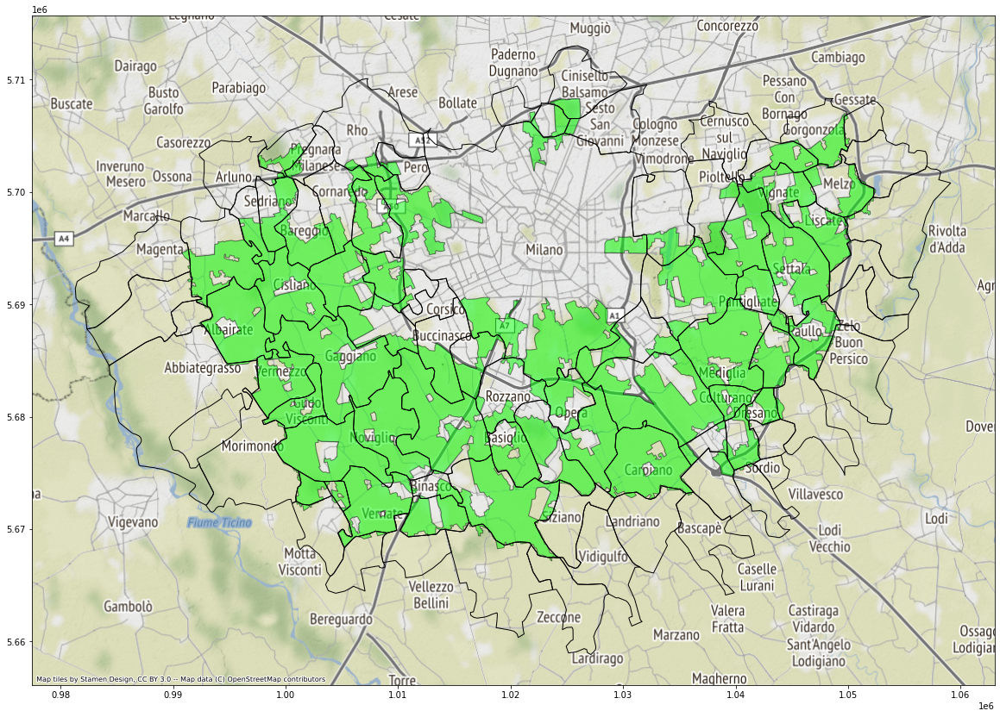

In [ ]:
ax = parchi_milano.to_crs(epsg = 3857).plot(figsize=(20,15), facecolor = "lime", edgecolor = "k", alpha = 0.5)
comuni_parchi.to_crs(epsg = 3857).plot(ax=ax, edgecolor = "k", facecolor = "None")
ctx.add_basemap(ax)

visualizzare i comuni confinanti con milano

In [ ]:
comuni_confinanti = comuni[comuni.touches(milano.geometry.squeeze())]
comuni_confinanti

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1814,1,3,15,215,215,15009,015009,Arese,None,0,14252.406342,6.317493e+06,"POLYGON ((506416.116 5045124.529, 506782.458 5..."
1816,1,3,15,215,215,15011,015011,Assago,None,0,12853.544196,8.397610e+06,"POLYGON ((511386.603 5029333.275, 511518.968 5..."
1825,1,3,15,215,215,15027,015027,Bollate,None,0,19203.626038,1.289232e+07,"POLYGON ((508068.588 5045562.067, 508068.588 5..."
1826,1,3,15,215,215,15032,015032,Bresso,None,0,7156.575704,3.541098e+06,"POLYGON ((514613.122 5043643.623, 515033.668 5..."
1828,1,3,15,215,215,15036,015036,Buccinasco,None,0,18782.927234,1.197888e+07,"POLYGON ((509908.110 5030714.300, 510291.086 5..."
1846,1,3,15,215,215,15074,015074,Cesano Boscone,None,0,11732.421451,3.955227e+06,"POLYGON ((506991.974 5033297.204, 507033.799 5..."
1850,1,3,15,215,215,15081,015081,Cologno Monzese,None,0,13728.742127,8.300571e+06,"POLYGON ((521178.812 5044037.362, 521198.630 5..."
1853,1,3,15,215,215,15086,015086,Cormano,None,0,9385.424982,4.543172e+06,"POLYGON ((513324.450 5044373.750, 513413.918 5..."
1855,1,3,15,215,215,15093,015093,Corsico,None,0,13378.408354,4.671315e+06,"POLYGON ((508715.786 5032711.622, 508754.073 5..."
1857,1,3,15,215,215,15097,015097,Cusago,None,0,15712.454369,1.156919e+07,"POLYGON ((502905.966 5034740.413, 503349.392 5..."


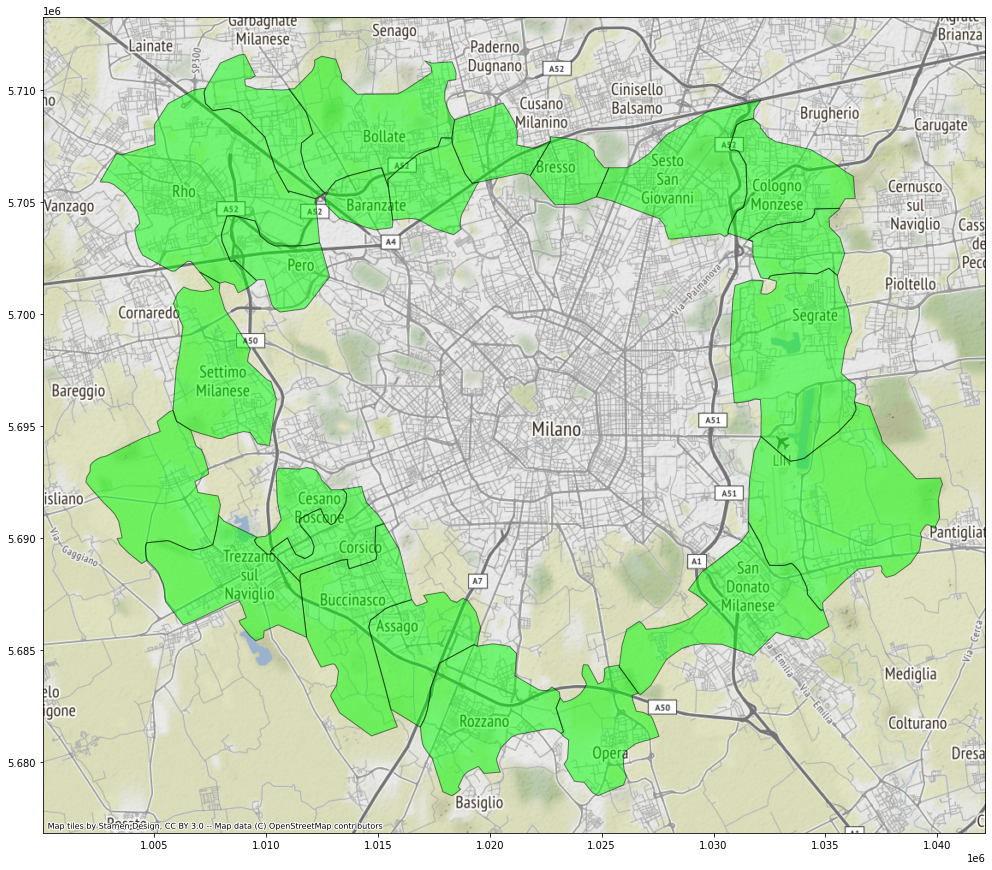

In [ ]:
ax = comuni_confinanti.to_crs(epsg = 3857).plot(figsize=(20,15), facecolor = "lime", edgecolor = "k", alpha = 0.5)
ctx.add_basemap(ax)

trovare il comune piu esteso che confina con milano

In [ ]:
com_piu_grande = comuni_confinanti[comuni_confinanti.Shape_Area == comuni_confinanti["Shape_Area"].max()]
com_piu_grande

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1897,1,3,15,215,215,15171,015171,Peschiera Borromeo,None,0,22044.433303,2.240204e+07,"POLYGON ((524640.471 5035256.833, 525021.665 5..."


trovare il comune meno esteso che confina con milano

In [ ]:
com_piu_piccolo = comuni_confinanti[comuni_confinanti.Shape_Area == comuni_confinanti["Shape_Area"].min()]
com_piu_piccolo

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1942,1,3,15,215,215,15250,015250,Baranzate,None,0,6567.963947,2.944838e+06,"POLYGON ((509363.172 5042554.492, 509538.293 5..."


trovare il comune meno esteso e piu esteso in un codice che confina con milano

In [ ]:
com_pic_grande = comuni_confinanti[(comuni_confinanti.Shape_Area == comuni_confinanti["Shape_Area"].min()) | (comuni_confinanti.Shape_Area == comuni_confinanti["Shape_Area"].max())]
com_pic_grande

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1897,1,3,15,215,215,15171,015171,Peschiera Borromeo,None,0,22044.433303,2.240204e+07,"POLYGON ((524640.471 5035256.833, 525021.665 5..."
1942,1,3,15,215,215,15250,015250,Baranzate,None,0,6567.963947,2.944838e+06,"POLYGON ((509363.172 5042554.492, 509538.293 5..."


visualizzare i comuni confinanti che confinano con milano

In [ ]:
comuni_confinanti_confinanti = comuni[comuni.touches(comuni_confinanti.unary_union)]
comuni_confinanti_confinanti

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1817,1,3,15,215,215,15012,015012,Bareggio,None,0,15924.405593,1.130249e+07,"POLYGON ((499326.672 5038880.244, 499885.260 5..."
1819,1,3,15,215,215,15015,015015,Basiglio,None,0,12610.847629,8.473895e+06,"POLYGON ((512570.857 5023729.693, 513089.378 5..."
1843,1,3,15,215,215,15070,015070,Cernusco sul Naviglio,None,0,19866.889330,1.305260e+07,"POLYGON ((525525.035 5043665.040, 525555.661 5..."
1848,1,3,15,215,215,15077,015077,Cinisello Balsamo,None,0,16531.699850,1.291846e+07,"POLYGON ((516890.340 5047212.224, 517410.573 5..."
1849,1,3,15,215,215,15078,015078,Cisliano,None,0,21169.784568,1.454520e+07,"POLYGON ((498883.140 5034380.609, 498795.447 5..."
1854,1,3,15,215,215,15087,015087,Cornaredo,None,0,17469.236711,1.126474e+07,"POLYGON ((501732.807 5040130.568, 501838.118 5..."
1858,1,3,15,215,215,15098,015098,Cusano Milanino,None,0,7499.893929,3.121779e+06,"POLYGON ((515349.475 5045417.489, 515401.299 5..."
1861,1,3,15,215,215,15103,015103,Gaggiano,None,0,35500.172635,2.608967e+07,"POLYGON ((498465.706 5030441.138, 498694.048 5..."
1862,1,3,15,215,215,15105,015105,Garbagnate Milanese,None,0,13572.108181,9.059366e+06,"POLYGON ((506293.329 5048263.724, 507440.215 5..."
1870,1,3,15,215,215,15116,015116,Lainate,None,0,16631.686289,1.231755e+07,"POLYGON ((502080.053 5048331.506, 502101.022 5..."


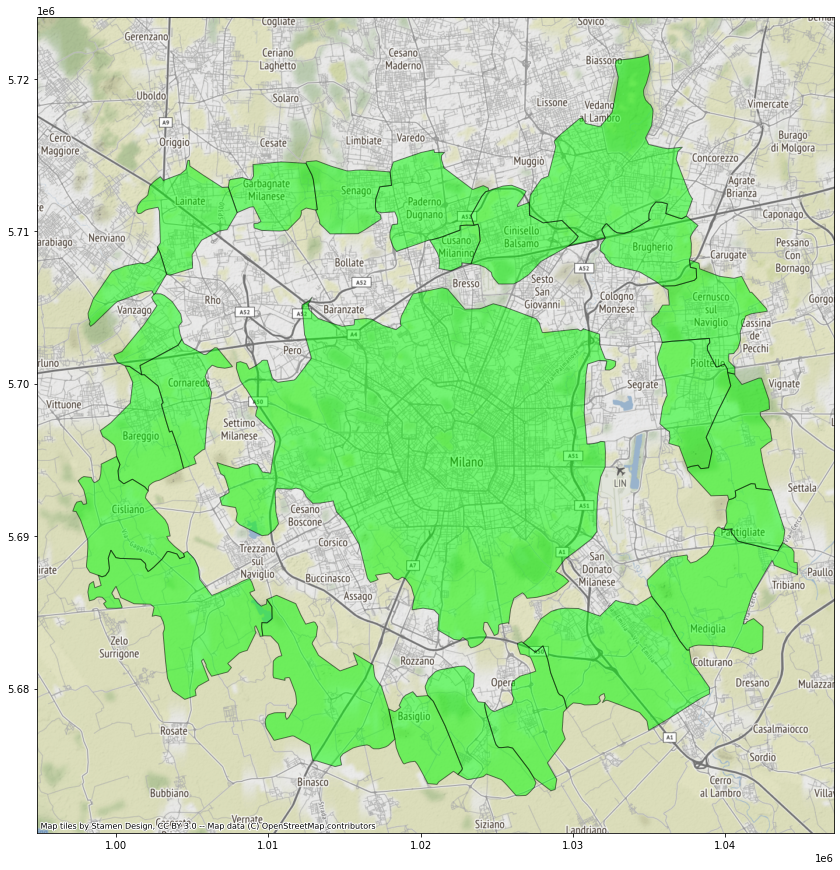

In [ ]:
ax = comuni_confinanti_confinanti.to_crs(epsg = 3857).plot(figsize=(20,15), facecolor = "lime", edgecolor = "k", alpha = 0.5)
ctx.add_basemap(ax)

b. analogo al primo esercizio ma tracciando sulla mappa solo i quartieri di Milano attraversati da parchi (e non tutta la città)


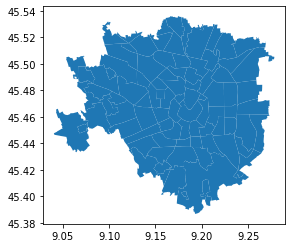

In [ ]:
quartieri.plot()

In [ ]:

#   controllare sempre se l'epsg è uguale
quartieri_attraversati = quartieri[quartieri.intersects(parchi_milano.to_crs(epsg=4326).unary_union)]
quartieri_attraversati

,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry
0,48,RONCHETTO SUL NAVIGLIO - Q.RE LODOVICO IL MORO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8723.368714,2.406306e+06,89,"POLYGON ((9.15422 45.43775, 9.15419 45.43707, ..."
1,64,TRENNO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3309.998800,4.896921e+05,90,"POLYGON ((9.10623 45.49016, 9.10295 45.48939, ..."
4,84,PARCO NORD,05/02/2020,Vigente,Milano 2030 - PGT Approvato,11741.717005,1.532331e+06,93,"POLYGON ((9.20040 45.52848, 9.20055 45.52828, ..."
5,63,FIGINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5622.522341,1.424660e+06,94,"POLYGON ((9.08375 45.48485, 9.08280 45.48521, ..."
9,61,QUARTO CAGNINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,4648.169991,9.863542e+05,98,"POLYGON ((9.11143 45.47640, 9.11193 45.47624, ..."
10,60,STADIO - IPPODROMI,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8277.734101,3.435178e+06,99,"POLYGON ((9.13020 45.48464, 9.13075 45.48449, ..."
11,62,QUINTO ROMANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6962.785127,1.645797e+06,100,"POLYGON ((9.08375 45.48485, 9.08444 45.48459, ..."
20,83,BRUZZANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6441.288643,1.670440e+06,109,"POLYGON ((9.17808 45.53479, 9.17807 45.53439, ..."
23,47,CANTALUPA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5161.415348,9.266817e+05,112,"POLYGON ((9.16112 45.42589, 9.16270 45.42544, ..."
24,39,QUINTOSOLE,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6740.830821,1.058525e+06,113,"POLYGON ((9.21047 45.39699, 9.21039 45.39698, ..."


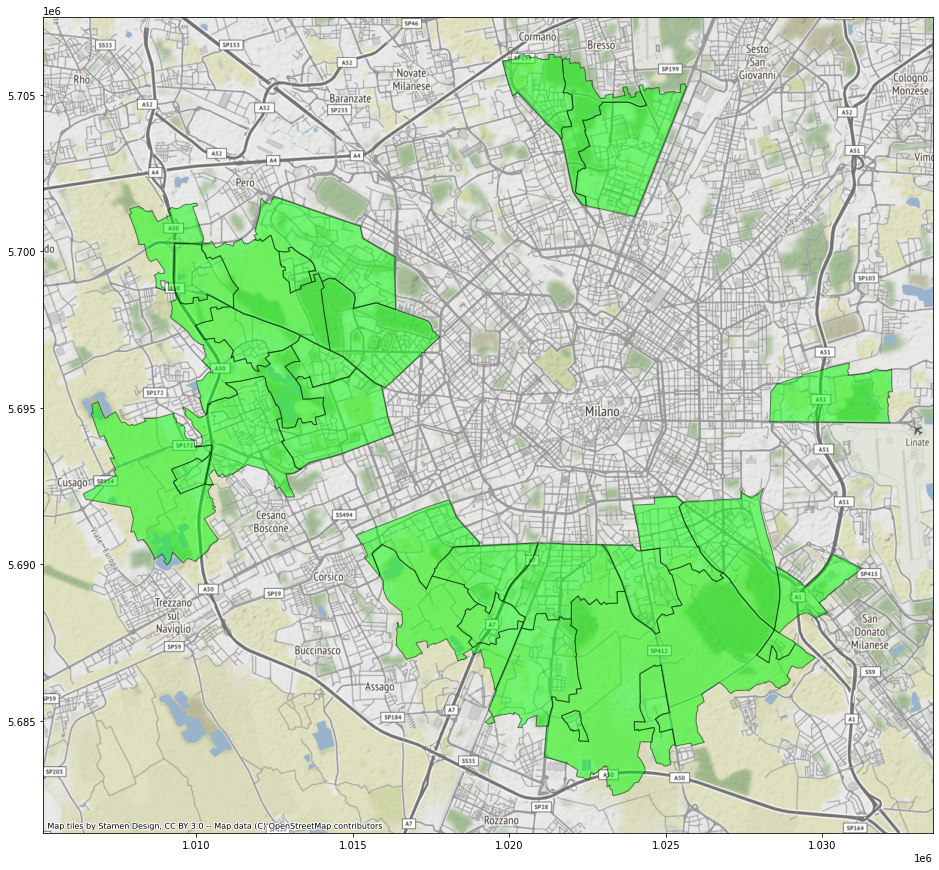

In [ ]:
ax = quartieri_attraversati.to_crs(epsg = 3857).plot(figsize=(20,15), facecolor = "lime", edgecolor = "k", alpha = 0.5)
ctx.add_basemap(ax)

c. dato il nome di un parco, avere la mappa del parco con i comuni che lo ospitano

inserire il nome del parco: Parco Adamello


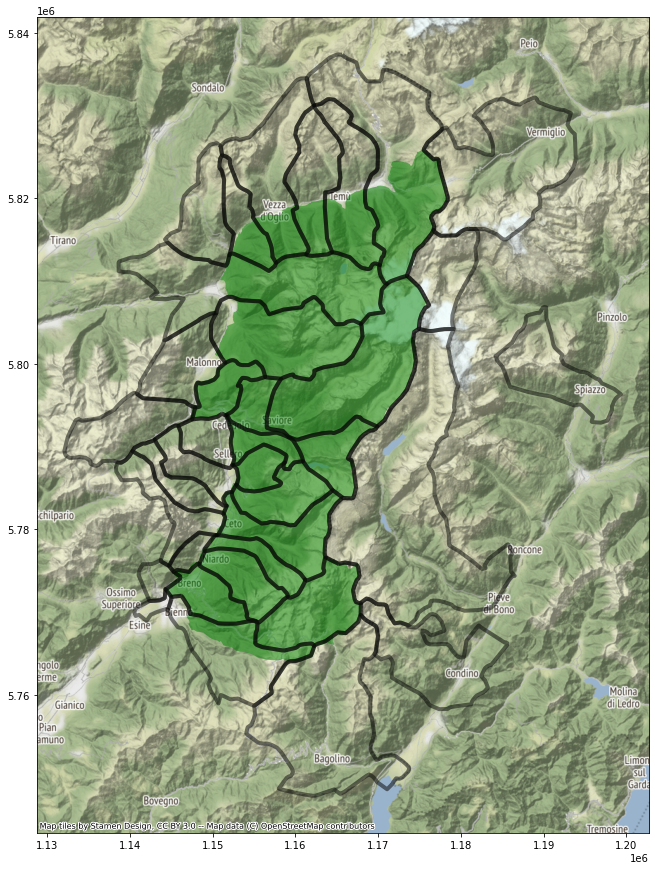

In [ ]:
parco = input("inserire il nome del parco: ")
parconordosud = parchi[parchi.NOME == parco]
comuni_parco = comuni[comuni.intersects(parconordosud.geometry.squeeze())]


ax = parconordosud.to_crs(epsg=3857).plot(figsize=(20,15), alpha = 0.5, facecolor= "green")
comuni_parco.to_crs(epsg=3857).plot(ax=ax, figsize=(20,15), alpha = 0.5, facecolor= "None", linewidth = 4, edgecolor = "k")
ctx.add_basemap(ax)

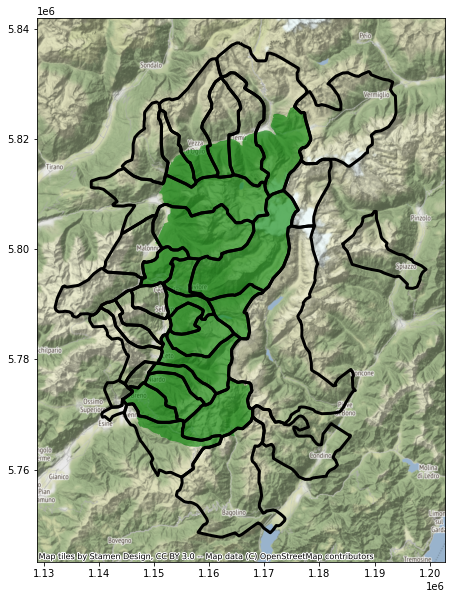

In [ ]:
#########             CON IL CONTROLLO


mappa_parco = parchi[parchi.NOME == parco]
comuni_parco_g = comuni[comuni.intersects(mappa_parco.geometry.squeeze())]


#   per controllare se il dato è all interno di una geometria, perche i parchi sono solo della lombardia
if mappa_parco.count().values[0] != 0:


  ax = mappa_parco.to_crs(epsg=3857).plot(figsize=(20,10), alpha = 0.6, facecolor = "green")
  comuni_parco_g.to_crs(epsg=3857).plot(ax = ax, edgecolor = "k", facecolor = "none", linewidth=3)
  ctx.add_basemap(ax)
else:
  print("Il parco non si trova in Lombardia")

d. dato il nome di un parco, avere la mappa del parco con le province che attraversa

In [ ]:
nome_parco = input("inserire il nome del parco: ")
parco_4 = parchi[parchi.NOME == nome_parco]
parco_4

inserire il nome del parco: Parco Adamello


,FID,NOME,COD_AREA,CLASSIF,DCLASSIF,TIPO,DTIPO,TIPO_AREA,DTIPO_AREA,COD_NOME,geometry
7,4,Parco Adamello,4,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,4: Parco Adamello,"POLYGON ((617719.939 5125721.072, 617744.313 5..."


In [ ]:
prov_principale = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/Limiti01012021_g/Limiti01012021_g/ProvCM01012021_g")
prov_principale

In [ ]:
quartieri_attraversati = prov_principale[prov_principale.intersects(parco_4.geometry.squeeze())]
quartieri_attraversati

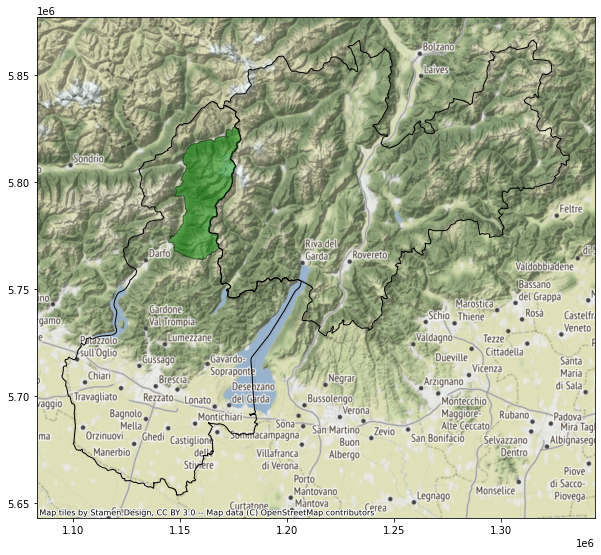

In [ ]:
ax = quartieri_attraversati.to_crs(epsg=3857).plot(figsize=(10,10), edgecolor="k", facecolor="none")
parco_4.to_crs(epsg=3857).plot(ax=ax, edgecolor="k", facecolor="green", alpha = 0.5)
ctx.add_basemap(ax)

In [ ]:
#########             CON IL CONTROLLO


mappa_parco = parchi[parchi.NOME == parco]
comuni_parco_g = comuni[comuni.intersects(mappa_parco.geometry.squeeze())]


#   per controllare se il dato è all interno di una geometria, perche i parchi sono solo della lombardia
if mappa_parco.count().values[0] != 0:


  ax = mappa_parco.to_crs(epsg=3857).plot(figsize=(20,10), alpha = 0.6, facecolor = "green")
  comuni_parco_g.to_crs(epsg=3857).plot(ax = ax, edgecolor = "k", facecolor = "none", linewidth=3)
  ctx.add_basemap(ax)
else:
  print("Il parco non si trova in Lombardia")

e. dato un comune, avere i parchi che ospita (elenco e mappa)

In [ ]:
comune_5 = comuni[comuni.COMUNE == input("inserire il nome del comune: ")]
comune_5

inserire il nome del parco: Milano


,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1882,1,3,15,215,215,15146,015146,Milano,None,1,79382.994008,1.807534e+08,"POLYGON ((513714.538 5042508.056, 513985.199 5..."


In [ ]:
parchi_ospitati = parchi[parchi.intersects(comune_5.geometry.squeeze())]
parchi_ospitati

,FID,NOME,COD_AREA,CLASSIF,DCLASSIF,TIPO,DTIPO,TIPO_AREA,DTIPO_AREA,COD_NOME,geometry
20,21,Parco Nord Milano,22,5,Parco di cintura metropolitana,2,Parco Regionale,1,Area Regionale,22:Parco Nord Milano,"POLYGON ((516502.662 5041742.040, 516403.321 5..."
21,22,Parco Sud Milano,23,15,Parco agricolo e di cintura metropolitana,2,Parco Regionale,1,Area Regionale,23:Parco Sud Milano,"POLYGON ((533691.079 5042919.602, 533758.703 5..."


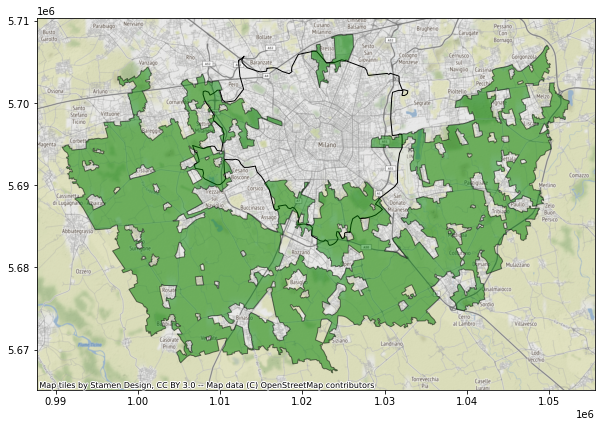

In [ ]:
ax = comune_5.to_crs(epsg=3857).plot(figsize=(10,10), edgecolor="k", facecolor="none")
parchi_ospitati.to_crs(epsg=3857).plot(ax=ax, edgecolor="k", facecolor="green", alpha = 0.5)
ctx.add_basemap(ax)

f. dato il nome di una provincia, avere i parchi che ospita (elenco e mappa)


In [ ]:
prov_6 = prov_principale[prov_principale.DEN_UTS == input("inserire il nome della provincia: ")]
prov_6

inserire il nome della provincia: Milano


,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,DEN_PROV,DEN_CM,DEN_UTS,SIGLA,TIPO_UTS,Shape_Leng,Shape_Area,geometry
14,1,3,15,215,215,-,Milano,Milano,MI,Citta metropolitana,309951.219188,1.575033e+09,"MULTIPOLYGON (((538136.289 5004372.814, 539162..."


In [ ]:
parchi_ospitati_6 = parchi[parchi.intersects(prov_6.geometry.squeeze())]
parchi_ospitati_6

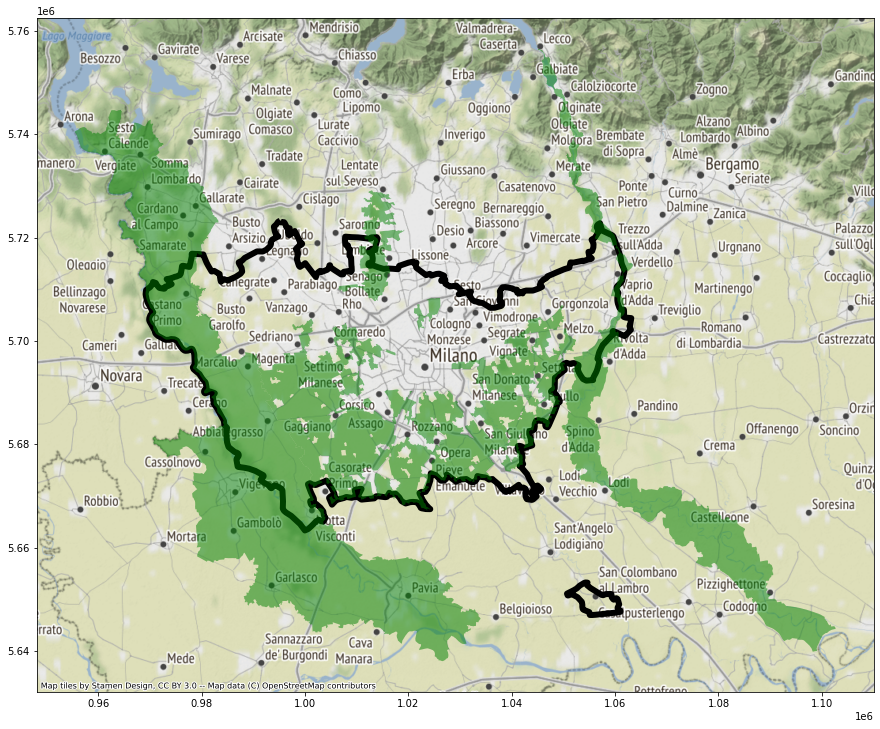

In [ ]:
ax = prov_6.to_crs(epsg=3857).plot(figsize = (15,15), edgecolor="k", facecolor="none", linewidth = 6)
parchi_ospitati_6.to_crs(epsg=3857).plot(ax=ax, facecolor="green", alpha = 0.5)
ctx.add_basemap(ax)

g. Controllare sempre che i dati inserit dall'utente  facciano parte della Lombardia e fornire un messaggio opportuno se l'input non soddisfa questa condizione. Al termine, postare il notebook realizzato ceh deve chiamarsi cognome-es6.ipynb

In [ ]:
parchi

,FID,NOME,COD_AREA,CLASSIF,DCLASSIF,TIPO,DTIPO,TIPO_AREA,DTIPO_AREA,COD_NOME,geometry
0,5,Parco Alpi Orobie Valtellinesi,18,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,18:Parco Alpi Orobie Valtellinesi,"POLYGON ((587577.037 5107497.548, 587615.036 5..."
1,6,Parco Alpi Orobie Bergamasche,17,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,17:Parco Alpi Orobie Bergamasche,"POLYGON ((586196.195 5100871.221, 586351.566 5..."
2,7,Parco Campo dei Fiori,9,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,9: Parco Campo dei Fiori,"POLYGON ((486537.216 5078441.081, 486530.341 5..."
3,8,Parco Alto Garda Bresciano,7,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,7: Parco Alto Garda Bresciano,"POLYGON ((617860.123 5053114.432, 617863.431 5..."
4,1,National Park (CH),99,0,Non valutato,1,Parco Nazionale,3,Area extranazionale,99:National Park (CH),"POLYGON ((584084.298 5161019.100, 583763.056 5..."
5,2,Parco Nazionale dello Stelvio (TN-BZ),97,0,Non valutato,1,Parco Nazionale,2,Area extraregionale,97:Parco Nazionale dello Stelvio (TN-BZ),"POLYGON ((611429.112 5154022.734, 612080.475 5..."
6,3,Parco Nazionale dello Stelvio,98,0,Non valutato,1,Parco Nazionale,1,Area Regionale,98:Parco Nazionale dello Stelvio,"POLYGON ((584084.298 5161019.100, 584083.048 5..."
7,4,Parco Adamello,4,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,4: Parco Adamello,"POLYGON ((617719.939 5125721.072, 617744.313 5..."
8,9,Parco Adda Nord,5,45,Parco fluviale e di cintura metropolitana,2,Parco Regionale,1,Area Regionale,5: Parco Adda Nord,"POLYGON ((533258.682 5067541.607, 533248.433 5..."
9,15,Parco Valle del Ticino,1,1245,"Parco agricolo,forestale,fluviale e di cintura...",2,Parco Regionale,1,Area Regionale,1: Parco Valle del Ticino,"POLYGON ((476666.268 5067282.167, 476899.067 5..."


In [ ]:
dato = input("Inserisci il nome del parco: ")
mappa_parco = parchi[parchi.NOME == dato]
comuni_parco = comuni[comuni.intersects(mappa_parco.geometry.squeeze())]


#   per controllare se il dato è all interno di una geometria, perche i parchi sono solo della lombardia
if mappa_parco.count().values[0] != 0:


  ax = mappa_parco.to_crs(epsg=3857).plot(figsize=(20,10), alpha = 0.6, facecolor = "green")
  comuni_parco.to_crs(epsg=3857).plot(ax = ax, edgecolor = "k", facecolor = "none", linewidth=3)
  ctx.add_basemap(ax)
else:
  print("Il parco non si trova in Lombardia")

Inserisci il nome del parco: Parco di cintura metropolitana
Il parco non si trova in Lombardia


/usr/local/lib/python3.7/dist-packages/geopandas/base.py:31: UserWarning: The indices of the two GeoSeries are different.
  warn("The indices of the two GeoSeries are different.")


In [ ]:
mappa_parco.count()

FID           0
NOME          0
COD_AREA      0
CLASSIF       0
DCLASSIF      0
TIPO          0
DTIPO         0
TIPO_AREA     0
DTIPO_AREA    0
COD_NOME      0
geometry      0
dtype: int64

In [ ]:
mappa_parco.count().values[0]

0